# Unsupervised ML - Clustering wines according to rated qualities

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

from sklearn.neural_network import MLPClassifier

from sklearn import metrics


# Exploratory Data Analysis

In [2]:
redwine_data = pd.read_csv('winequality-red.csv', delimiter=';' )
redwine_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [3]:
whitewine_data = pd.read_csv('winequality-white.csv', delimiter=';' )
whitewine_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


<AxesSubplot:>

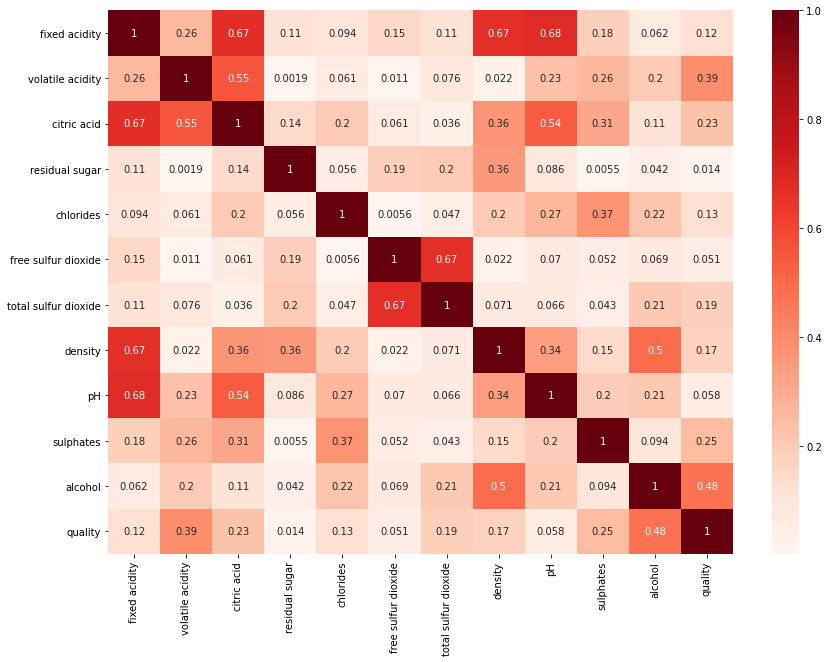

In [4]:
corr_matrix = redwine_data.corr().abs()
plt.figure(figsize=(14,10))
sns.heatmap(corr_matrix, annot=True, cmap='Reds')

<AxesSubplot:>

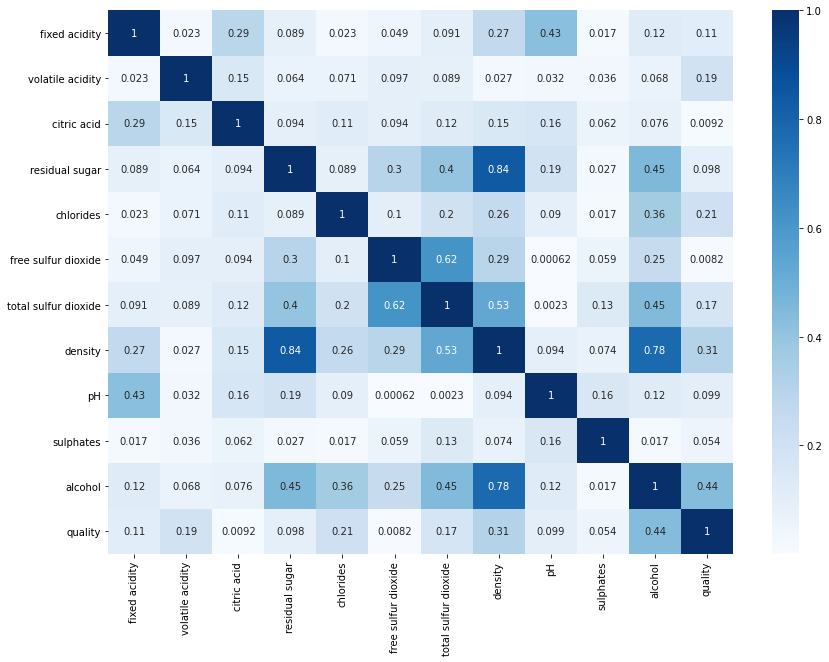

In [5]:
corr_matrix = whitewine_data.corr().abs()
plt.figure(figsize=(14,10))
sns.heatmap(corr_matrix, annot=True, cmap='Blues')

- From the heatmaps, it looks like the quality of wines are highly correlated with alcohol i.e. 
    - In descending order, red wines quality are highly dependent on alchohol (0.48), volatile acidity (0.39), sulphates (0.25) and citric acid (0.23)
    - In descending order, white wines quality are highly dependent on alchohol (0.44), density (0.31) and chlorides (0.21)

- There are also noticeable strong correlation between properties highlighted in saturated cells of the heatmap in the red wines and white wines.

# Checking the data for nulls

In [6]:
whitewine_data.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [7]:
redwine_data.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [8]:
whitewine_data.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [9]:
redwine_data.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [10]:
whitewine_data['quality'].unique()

array([6, 5, 7, 8, 4, 3, 9], dtype=int64)

In [11]:
redwine_data['quality'].unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

# Preprocessing

- For now we'll focus on red wines

In [12]:
X = redwine_data.drop(['quality'], axis=1)
X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


In [13]:
y = redwine_data['quality']
y.head()

0    5
1    5
2    5
3    6
4    5
Name: quality, dtype: int64

- We'll scale our X using RobustScaler, which removes the median and scales the data according to the interquantile range i.e. interquantile range (IQR) as default. The IQR is the range between the 1st quartile (25th quantile) and the 3rd quartile (75th quantile).

In [14]:
scaler = RobustScaler() # gives a better results in accuracy and clearer cluster distinction than StandardScaler()
scaler

RobustScaler()

In [15]:
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X_scaled

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,-0.238095,0.72,-0.787879,-0.428571,-0.15,-0.214286,-0.100,0.469799,1.052632,-0.333333,-0.5000
1,-0.047619,1.44,-0.787879,0.571429,0.95,0.785714,0.725,0.022371,-0.578947,0.333333,-0.2500
2,-0.047619,0.96,-0.666667,0.142857,0.65,0.071429,0.400,0.111857,-0.263158,0.166667,-0.2500
3,1.571429,-0.96,0.909091,-0.428571,-0.20,0.214286,0.550,0.559284,-0.789474,-0.222222,-0.2500
4,-0.238095,0.72,-0.787879,-0.428571,-0.15,-0.214286,-0.100,0.469799,1.052632,-0.333333,-0.5000
...,...,...,...,...,...,...,...,...,...,...,...
1594,-0.809524,0.32,-0.545455,-0.285714,0.55,1.285714,0.150,-0.827740,0.736842,-0.222222,0.1875
1595,-0.952381,0.12,-0.484848,0.000000,-0.85,1.785714,0.325,-0.729306,1.105263,0.777778,0.6250
1596,-0.761905,-0.04,-0.393939,0.142857,-0.15,1.071429,0.050,-0.451902,0.578947,0.722222,0.5000
1597,-0.952381,0.50,-0.424242,-0.285714,-0.20,1.285714,0.150,-0.572707,1.368421,0.500000,0.0000


# Clustering
- For clustering we'll use KMeans since it a simple general purpose algorithm that can give good results and is very scalable.

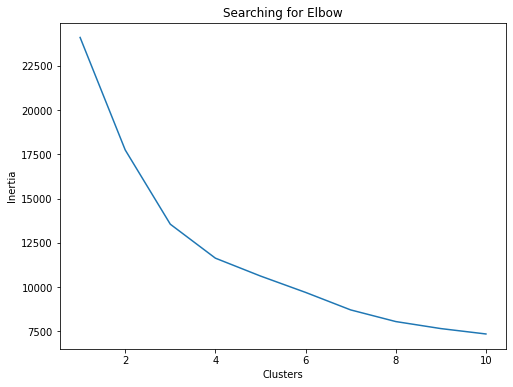

In [98]:
inertias = []

for i in range(1, 11):
    km = KMeans(n_clusters=i).fit(X_scaled)
    inertias.append(km.inertia_)
    
fig, ax = plt.subplots(figsize=(8, 6))
sns.lineplot(x=list(range(1, 11)), y=inertias, ax=ax)
ax.set_title('Searching for Elbow')
ax.set_xlabel('Clusters')
ax.set_ylabel('Inertia')

plt.show()

- Possible number of clusters = 2, 3 or 4
- Let's use 3 clusters for our KMeans

In [17]:
kmeans = KMeans(n_clusters=3, random_state=1)
kmeans.fit(X_scaled) # no transforming, just fitting

KMeans(n_clusters=3, random_state=1)

In [18]:
clusters = kmeans.predict(X_scaled)
clusters

array([0, 0, 0, ..., 0, 0, 0])

# Visualisation
- In order to visualise our results, we have to first reduce our 11 columns of X into 2 dimensions. We can use Principal Component Analysis (PCA), which transforms 11 columns into 2 columns of principle components

In [19]:
pca = PCA(n_components=2)
pca

PCA(n_components=2)

In [20]:
X_pca = pd.DataFrame(pca.fit_transform(X_scaled), columns=['PC1', 'PC2'])
X_pca['cluster'] = clusters # We assign each row their respective cluster so we can use it to colour our clusters later
X_pca

,PC1,PC2,cluster
0,-0.941290,-0.802666,0
1,0.590175,0.010407,0
2,0.151494,-0.395321,0
3,-0.493991,-0.446335,0
4,-0.941290,-0.802666,0
...,...,...,...
1594,-0.389994,-0.881942,0
1595,-1.541582,-0.264147,0
1596,-0.759906,-0.301929,0
1597,-1.010128,-0.725996,0


In [21]:
kmeans.cluster_centers_  # We will also plot the cluster centers later, so the next step also applies PCA to the 11-dimensional centers to transform them into 2 dimensions

array([[ 1.97072072e-01,  2.79729730e-02,  7.08435708e-03,
         1.08301158e-01,  1.11689189e-01,  1.12331081e-01,
         1.75996622e-01, -4.79956467e-02,  3.47083926e-02,
         1.60735736e-01,  1.44123029e-01],
       [ 1.73160173e-01,  1.04242424e-01,  6.32690542e-01,
        -2.46753247e-01,  1.38272727e+01, -5.08658009e-02,
         2.21969697e-01,  1.28804827e-01, -9.48963317e-01,
         2.37878788e+00, -3.82575758e-01],
       [ 2.57475083e-01,  6.02325581e-02,  2.53699789e-01,
         7.23006645e+00,  6.43023256e-01,  5.76411960e-01,
         8.22093023e-01,  7.48920452e-01, -1.24235006e-01,
         2.61627907e-01,  2.57751938e-01]])

In [22]:
centers_pca = pd.DataFrame(pca.transform(kmeans.cluster_centers_), columns=['PC1', 'PC2'])
centers_pca

,PC1,PC2
0,-0.390882,-0.297317
1,13.047456,-3.807208
2,1.720217,6.577524


Text(0, 0.5, 'PC2')

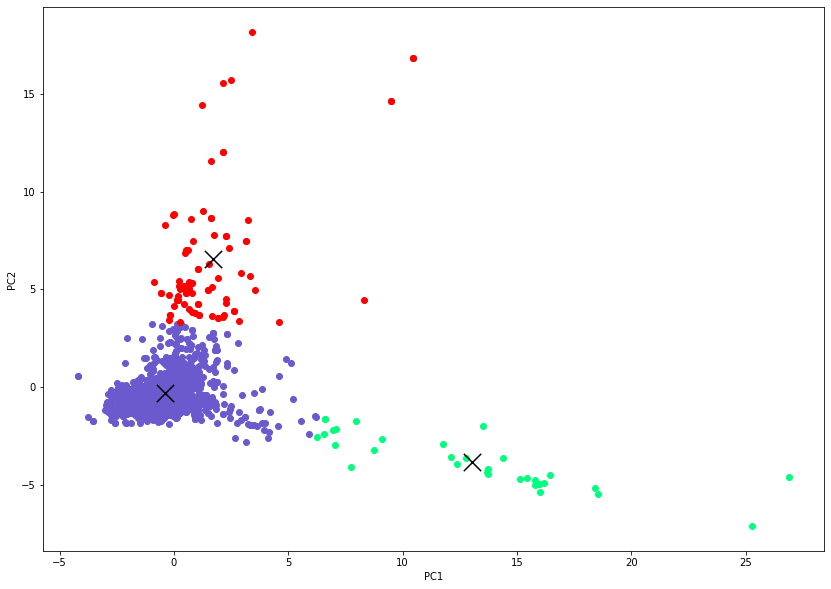

In [23]:
# Plotting our clusters
plt.figure(figsize=(14, 10))
plt.scatter(X_pca[X_pca['cluster']==0].loc[:, 'PC1'], X_pca[X_pca['cluster']==0].loc[:, 'PC2'], color = 'slateblue')
plt.scatter(X_pca[X_pca['cluster']==1].loc[:, 'PC1'], X_pca[X_pca['cluster']==1].loc[:, 'PC2'], color = 'springgreen')
plt.scatter(X_pca[X_pca['cluster']==2].loc[:, 'PC1'], X_pca[X_pca['cluster']==2].loc[:, 'PC2'], color = 'red')
plt.scatter(X_pca[X_pca['cluster']==3].loc[:, 'PC1'], X_pca[X_pca['cluster']==3].loc[:, 'PC2'], color = 'teal')
plt.scatter(X_pca[X_pca['cluster']==4].loc[:, 'PC1'], X_pca[X_pca['cluster']==4].loc[:, 'PC2'], color = 'grey')
plt.scatter(X_pca[X_pca['cluster']==5].loc[:, 'PC1'], X_pca[X_pca['cluster']==5].loc[:, 'PC2'], color = 'gold')

plt.scatter(centers_pca['PC1'], centers_pca['PC2'], marker='x', color='black', s=300)
plt.xlabel('PC1')
plt.ylabel('PC2')

# Training
- We'll use Multi-Layer Perceptron Classifier as our model

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, clusters, train_size=0.8, random_state=1) # 0.8 since we have a large dataset i.e. 1598 rows

In [25]:
model = MLPClassifier(hidden_layer_sizes=(256, 256), max_iter=500, random_state=1)
# convergence is roughly at 400 iterations, warning of convergence is not yet reached if max_iter is small
# hidden layer sizes is large. Small sizes should not work well for this red wine data
model

MLPClassifier(hidden_layer_sizes=(256, 256), max_iter=500, random_state=1)

In [26]:
model.fit(X_train, y_train) # don't need to transform, just fit the model

MLPClassifier(hidden_layer_sizes=(256, 256), max_iter=500, random_state=1)

In [27]:
print(f"Model accuracy: {model.score(X_test, y_test)}")

Model accuracy: 0.9875


# Explain model prediction using LIME

In [28]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=['Cluster_0', 'Cluster_1', 'Cluster_2'],
    mode='classification',
    random_state=1
)

- Explanations - Cluster 0

In [29]:
X_test.iloc[1]

fixed acidity           0.380952
volatile acidity        0.440000
citric acid             0.060606
residual sugar          0.714286
chlorides               0.850000
free sulfur dioxide     0.214286
total sulfur dioxide    0.775000
density                 0.263982
pH                     -0.263158
sulphates               0.055556
alcohol                 0.000000
Name: 1283, dtype: float64

In [30]:
y_test

array([0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0,
       2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0,
       2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [31]:
y_test[1]

0

In [32]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=model.predict_proba,
    labels=(0,),
    num_features=11,
    # top_labels=3
)
exp.show_in_notebook(show_table=True)

- Explanations - Cluster 1

In [33]:
X_test.iloc[7]

fixed acidity           0.476190
volatile acidity        0.360000
citric acid             0.696970
residual sugar         -0.285714
chlorides               9.550000
free sulfur dioxide     0.642857
total sulfur dioxide    1.800000
density                 0.201342
pH                     -1.000000
sulphates               2.222222
alcohol                -0.562500
Name: 181, dtype: float64

In [34]:
y_test[7]

1

In [35]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[7],
    predict_fn=model.predict_proba,
    labels=(1,),
    num_features=11,
    # top_labels=3
)
exp.show_in_notebook(show_table=True)

- Explanations - Cluster 2

In [36]:
X_test.iloc[8]

fixed acidity          -0.619048
volatile acidity        1.120000
citric acid            -0.696970
residual sugar          8.000000
chlorides               0.000000
free sulfur dioxide    -0.571429
total sulfur dioxide   -0.650000
density                -0.201342
pH                      1.105263
sulphates              -0.666667
alcohol                 1.250000
Name: 1186, dtype: float64

In [37]:
y_test[8]

2

In [38]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[8],
    predict_fn=model.predict_proba,
    labels=(2,),
    num_features=11,
    # top_labels=3
)
exp.show_in_notebook(show_table=True)

# Discussion
- For our red wines dataset, we have achieved a model accuracy of 0.9875

# Now let's investigate the white wines

# Preprocessing

In [39]:
X2 = whitewine_data.drop('quality', axis=1)
X2.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9


In [40]:
y2 = whitewine_data['quality']
y2.head()

0    6
1    6
2    6
3    6
4    6
Name: quality, dtype: int64

In [41]:
X2_scaled = pd.DataFrame(scaler.fit_transform(X2), columns=X2.columns)
X2_scaled

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,0.2,0.090909,0.333333,1.890244,0.142857,0.478261,0.610169,1.658481,-0.947368,-0.142857,-0.842105
1,-0.5,0.363636,0.166667,-0.439024,0.428571,-0.869565,-0.033898,0.059395,0.631579,0.142857,-0.473684
2,1.3,0.181818,0.666667,0.207317,0.500000,-0.173913,-0.627119,0.310680,0.421053,-0.214286,-0.157895
3,0.4,-0.272727,0.000000,0.402439,1.071429,0.565217,0.881356,0.424900,0.052632,-0.500000,-0.263158
4,0.4,-0.272727,0.000000,0.402439,1.071429,0.565217,0.881356,0.424900,0.052632,-0.500000,-0.263158
...,...,...,...,...,...,...,...,...,...,...,...
4893,-0.6,-0.454545,-0.250000,-0.439024,-0.285714,-0.434783,-0.711864,-0.593946,0.473684,0.214286,0.421053
4894,-0.2,0.545455,0.333333,0.341463,0.285714,1.000000,0.576271,0.264991,-0.157895,-0.071429,-0.421053
4895,-0.3,-0.181818,-1.083333,-0.487805,-0.142857,-0.173913,-0.389831,-0.274129,-1.000000,-0.071429,-0.526316
4896,-1.3,0.272727,-0.166667,-0.500000,-1.500000,-0.608696,-0.406780,-1.153626,0.842105,-0.642857,1.263158


# Clustering

In [42]:
whitewine_data['quality'].unique()

array([6, 5, 7, 8, 4, 3, 9], dtype=int64)

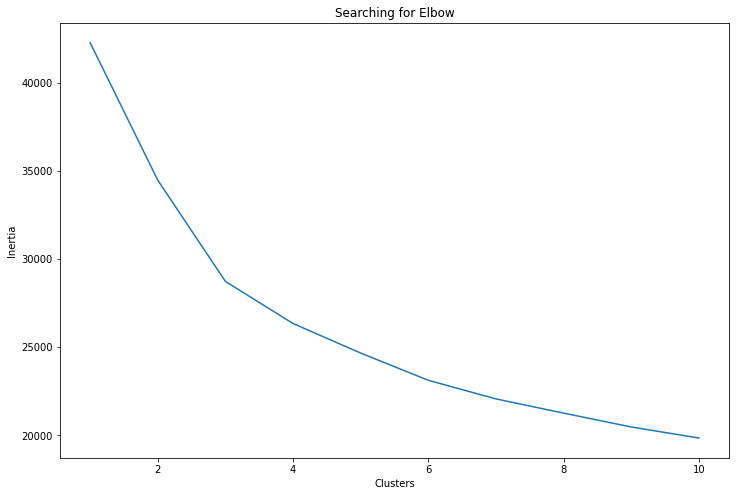

In [43]:
inertias2 = []

for i in range(1, 11):
    km2 = KMeans(n_clusters=i).fit(X2_scaled)
    inertias2.append(km2.inertia_)
    
fig, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(x=list(range(1, 11)), y=inertias2, ax=ax)
ax.set_title('Searching for Elbow')
ax.set_xlabel('Clusters')
ax.set_ylabel('Inertia')

plt.show()

- Possible number of clusters = 2 or 3. Let's pick 3 for our KMeans for white wines


In [44]:
kmeans2 = KMeans(n_clusters=3)
kmeans2

KMeans(n_clusters=3)

In [45]:
kmeans2.fit(X2_scaled)

KMeans(n_clusters=3)

In [46]:
clusters2 = kmeans2.predict(X2_scaled)
clusters2

array([1, 2, 1, ..., 2, 2, 2])

# Visualisation

In [47]:
X2_pca = pd.DataFrame(pca.fit_transform(X2_scaled), columns=['PC1', 'PC2'])
X2_pca['cluster'] = clusters2
X2_pca

,PC1,PC2,cluster
0,0.918102,-1.798875,1
1,0.059807,0.757422,2
2,0.362362,-0.480798,1
3,1.135260,-0.378273,1
4,1.135260,-0.378273,1
...,...,...,...
4893,-1.067206,1.014130,2
4894,0.477895,-0.489561,1
4895,-0.563104,0.670599,2
4896,-2.494310,1.405758,2


In [48]:
kmeans2.cluster_centers_

array([[-0.10188679,  0.50986278,  0.98899371, -0.07305568,  8.5902965 ,
         0.26517637,  0.16149664,  0.14600821, -0.44538232, -0.03706199,
        -0.43694141],
       [ 0.28244654,  0.16242485,  0.39893088,  0.61186947,  0.49836613,
         0.43736622,  0.6024366 ,  0.67328153, -0.10332644,  0.22497691,
        -0.41842236],
       [-0.10386552,  0.15517636, -0.11788326, -0.18377316, -0.33903529,
        -0.2262089 , -0.31161818, -0.37680672,  0.16832264,  0.08840602,
         0.4251462 ]])

In [49]:
centers2_pca = pd.DataFrame(pca.fit_transform(kmeans2.cluster_centers_), columns=['PC1', 'PC2'])
centers2_pca

,PC1,PC2
0,5.729092,-0.111282
1,-2.387828,1.058662
2,-3.341264,-0.947380


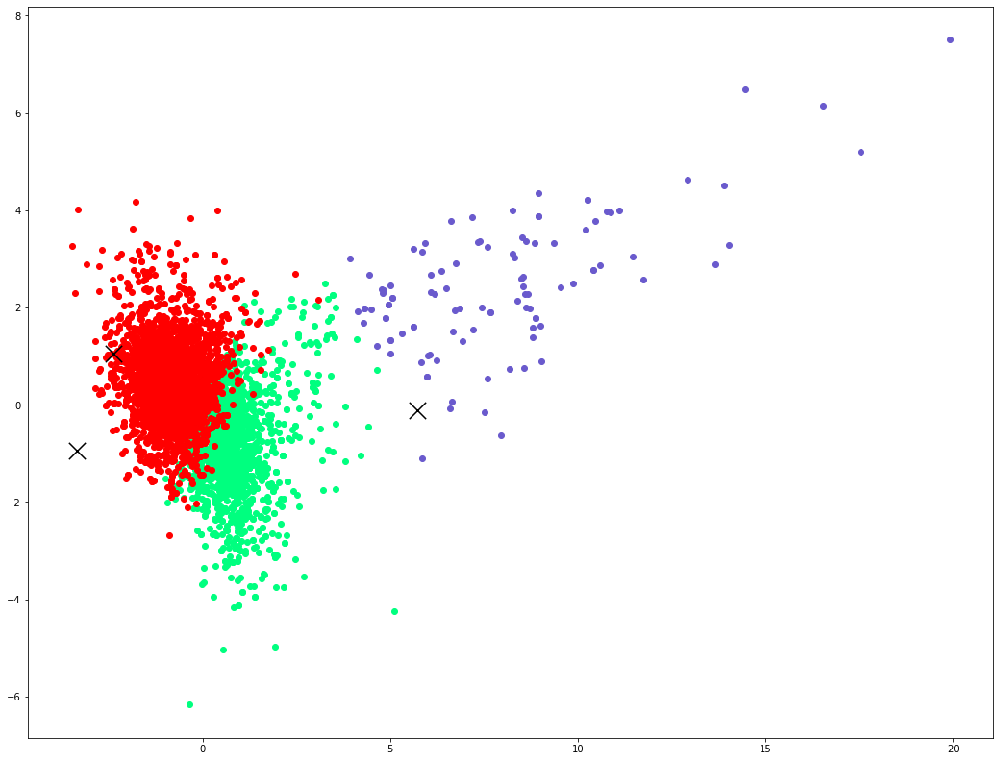

In [50]:
plt.figure(figsize=[18, 14])
plt.scatter(X2_pca[X2_pca['cluster']==0].loc[:, 'PC1'], X2_pca[X2_pca['cluster']==0].loc[:, 'PC2'], color = 'slateblue')
plt.scatter(X2_pca[X2_pca['cluster']==1].loc[:, 'PC1'], X2_pca[X2_pca['cluster']==1].loc[:, 'PC2'], color = 'springgreen')
plt.scatter(X2_pca[X2_pca['cluster']==2].loc[:, 'PC1'], X2_pca[X2_pca['cluster']==2].loc[:, 'PC2'], color = 'red')
plt.scatter(X2_pca[X2_pca['cluster']==3].loc[:, 'PC1'], X2_pca[X2_pca['cluster']==3].loc[:, 'PC2'], color = 'teal')
plt.scatter(X2_pca[X2_pca['cluster']==4].loc[:, 'PC1'], X2_pca[X2_pca['cluster']==4].loc[:, 'PC2'], color = 'grey')
plt.scatter(X2_pca[X2_pca['cluster']==5].loc[:, 'PC1'], X2_pca[X2_pca['cluster']==5].loc[:, 'PC2'], color = 'gold')
plt.scatter(X2_pca[X2_pca['cluster']==6].loc[:, 'PC1'], X2_pca[X2_pca['cluster']==6].loc[:, 'PC2'], color = 'pink')

plt.scatter(centers2_pca['PC1'], centers2_pca['PC2'], marker='x', color='black', s=300)

# Training
- Again we'll use MLP for our white wines

In [51]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2_scaled, clusters2, train_size=0.8)

In [52]:
model2 = MLPClassifier(hidden_layer_sizes=(256, 256), max_iter=500)
model2

MLPClassifier(hidden_layer_sizes=(256, 256), max_iter=500)

In [53]:
model2.fit(X2_train, y2_train)

MLPClassifier(hidden_layer_sizes=(256, 256), max_iter=500)

In [54]:
print(f"Model score for white wine: {model2.score(X2_test, y2_test)}")

Model score for white wine: 0.9948979591836735


# Explaining model prediction with LIME

In [55]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X2_train),
    feature_names=X2_train.columns,
    class_names=['Cluster_0', 'Cluster_1', 'Cluster_2'],
    mode='classification',
    random_state=1
)

In [56]:
X2_test.iloc[0]

fixed acidity           -0.500000
volatile acidity        -0.545455
citric acid              2.166667
residual sugar          -0.463415
chlorides               11.500000
free sulfur dioxide     -0.826087
total sulfur dioxide    -0.627119
density                 -0.146202
pH                      -0.105263
sulphates               -0.285714
alcohol                 -0.210526
Name: 1925, dtype: float64

In [57]:
y2_test[0]

0

In [58]:
exp = explainer.explain_instance(
    data_row=X2_test.iloc[0],
    predict_fn=model2.predict_proba,
    labels=(0,),
    num_features=11,
    # top_labels=3
)
exp.show_in_notebook(show_table=True)

In [59]:
X2_test.iloc[18]

fixed acidity           0.300000
volatile acidity        0.181818
citric acid            -1.083333
residual sugar          0.317073
chlorides              -0.214286
free sulfur dioxide     0.608696
total sulfur dioxide    0.847458
density                 0.468304
pH                     -0.105263
sulphates               0.214286
alcohol                -0.526316
Name: 2241, dtype: float64

In [60]:
y2_test[18]

1

In [61]:
exp = explainer.explain_instance(
    data_row=X2_test.iloc[18],
    predict_fn=model2.predict_proba,
    labels=(1,),
    num_features=11,
    # top_labels=3
)
exp.show_in_notebook(show_table=True)

In [62]:
X2_test.iloc[23]

fixed acidity           2.400000
volatile acidity        0.727273
citric acid             1.833333
residual sugar          1.475610
chlorides               1.214286
free sulfur dioxide     0.521739
total sulfur dioxide    1.711864
density                 1.845802
pH                     -0.526316
sulphates               1.000000
alcohol                -0.842105
Name: 2250, dtype: float64

In [63]:
y2_test[23]

1

In [64]:
exp = explainer.explain_instance(
    data_row=X2_test.iloc[23],
    predict_fn=model2.predict_proba,
    labels=(2,),
    num_features=11,
    # top_labels=3
)
exp.show_in_notebook(show_table=True)

# Discussion
- For our white wines dataset, we have achieved a model accuracy of 0.995

# Conclusion
- the model for white wines gives a slightly higher accuracy than for red wines (99.5% vs 98.8%)

# Further EDA but using clusters to colour our graphs
- We'll ignore the quality but use the clusters produced by our KMeans algorithm to see if there are any trends or groups in the graphs
- For red wines, we're interested in the the properties of residual sugar and chlorides as they are dominant features from our LIME explainer.
- For white wines, we're interested in the the properties of fixed acidity, citric acid, residual sugar, chlorides, free sulphur dioxide, density, and alcohol as they are dominant features from our LIME explainer.

In [65]:
redwine_data['cluster'] = clusters
redwine_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,cluster
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,0
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,0
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,0


- Comparing clusters with quality in redwine_data

In [67]:
redwine_data['quality'].unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [69]:
whitewine_data['cluster'] = clusters2
whitewine_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,cluster
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,2
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,2
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,1
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,2
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,2


In [71]:
whitewine_data['quality'].unique()

array([6, 5, 7, 8, 4, 3, 9], dtype=int64)

In [74]:
redwine_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,cluster
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,0
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,0
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,0


In [75]:
redwine_cluster_0 = redwine_data[redwine_data['cluster']==0]
redwine_cluster_1 = redwine_data[redwine_data['cluster']==1]
redwine_cluster_2= redwine_data[redwine_data['cluster']==2]

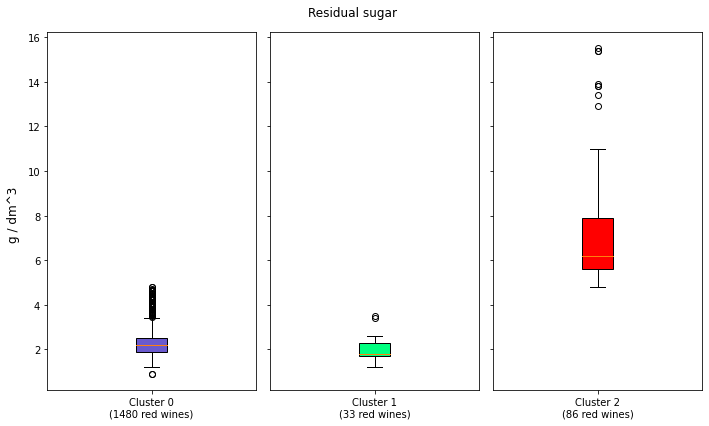

In [79]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,6), sharey=True)

ax1.boxplot(redwine_cluster_0.loc[:,'residual sugar'], patch_artist=True, boxprops=dict(facecolor='slateblue'))
ax2.boxplot(redwine_cluster_1.loc[:,'residual sugar'], patch_artist=True, boxprops=dict(facecolor='springgreen'))
ax3.boxplot(redwine_cluster_2.loc[:,'residual sugar'], patch_artist=True, boxprops=dict(facecolor='red'))

ax1.set_xticklabels([f'Cluster 0\n({len(redwine_cluster_0)} red wines)'])
ax2.set_xticklabels([f'Cluster 1\n({len(redwine_cluster_1)} red wines)'])
ax3.set_xticklabels([f'Cluster 2\n({len(redwine_cluster_2)} red wines)'])

fig.suptitle('Residual sugar')
fig.supylabel('g / dm^3')

fig.tight_layout()

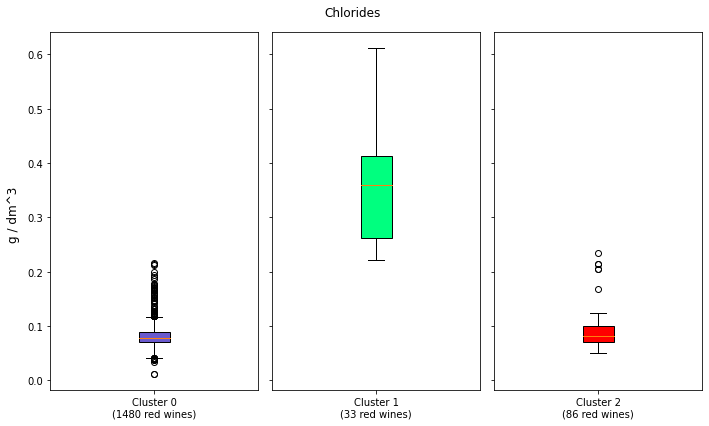

In [80]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,6), sharey=True)

ax1.boxplot(redwine_cluster_0.loc[:,'chlorides'], patch_artist=True, boxprops=dict(facecolor='slateblue'))
ax2.boxplot(redwine_cluster_1.loc[:,'chlorides'], patch_artist=True, boxprops=dict(facecolor='springgreen'))
ax3.boxplot(redwine_cluster_2.loc[:,'chlorides'], patch_artist=True, boxprops=dict(facecolor='red'))

ax1.set_xticklabels([f'Cluster 0\n({len(redwine_cluster_0)} red wines)'])
ax2.set_xticklabels([f'Cluster 1\n({len(redwine_cluster_1)} red wines)'])
ax3.set_xticklabels([f'Cluster 2\n({len(redwine_cluster_2)} red wines)'])

fig.suptitle('Chlorides')
fig.supylabel('g / dm^3')

fig.tight_layout()

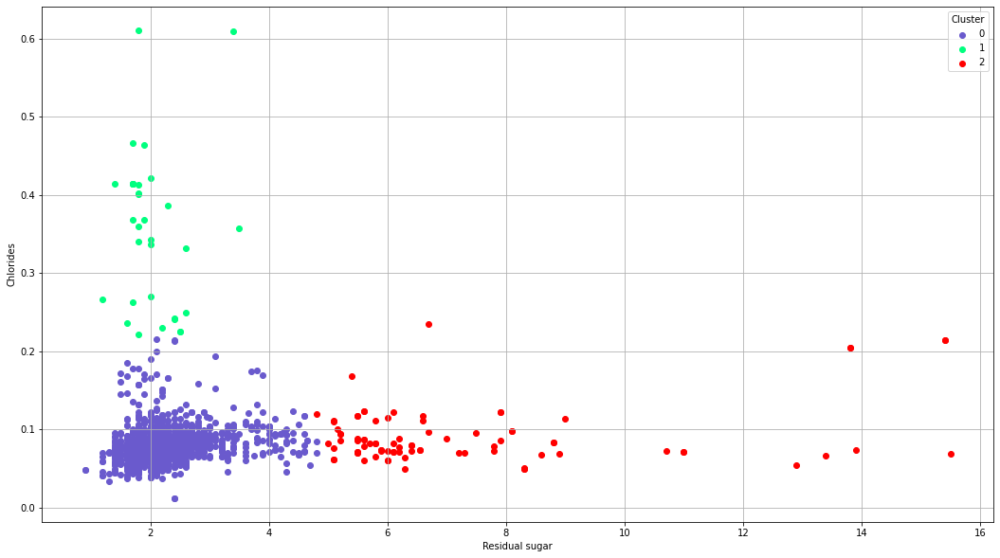

In [87]:
plt.figure(figsize=(18,10))
plt.scatter(redwine_cluster_0.loc[:, 'residual sugar'], redwine_cluster_0.loc[:, 'chlorides'], color='slateblue')
plt.scatter(redwine_cluster_1.loc[:, 'residual sugar'], redwine_cluster_1.loc[:, 'chlorides'], color='springgreen')
plt.scatter(redwine_cluster_2.loc[:, 'residual sugar'], redwine_cluster_2.loc[:, 'chlorides'], color='red')


plt.legend([0,1,2], title='Cluster')
plt.xlabel('Residual sugar')
plt.ylabel('Chlorides')
plt.grid()

- Observations in red wines:
    - Cluster 2 has relatively high residual sugar
    - Cluster 1 has relatively high chlorides
    - Cluster 0 does not have relatively high residual sugar nor chlorides
    - However, cluster ratio distribution is highly uneven


In [88]:
whitewine_data

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,cluster
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,1
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,2
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,2
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,1
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,2
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,2


In [89]:
whitewine_cluster_0 = whitewine_data[whitewine_data['cluster']==0]
whitewine_cluster_1 = whitewine_data[whitewine_data['cluster']==1]
whitewine_cluster_2= whitewine_data[whitewine_data['cluster']==2]

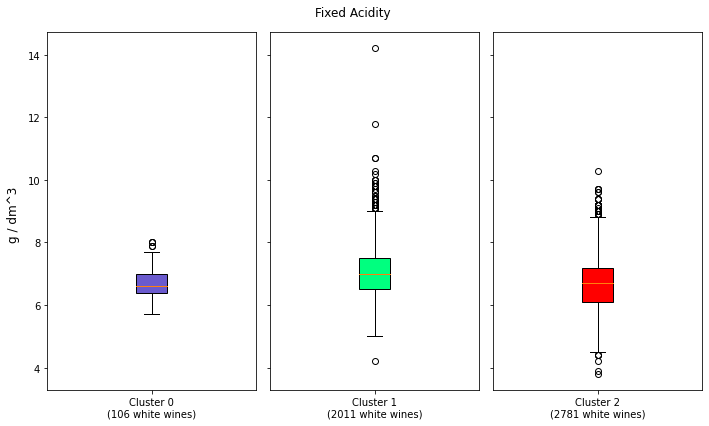

In [90]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,6), sharey=True)

ax1.boxplot(whitewine_cluster_0.loc[:,'fixed acidity'], patch_artist=True, boxprops=dict(facecolor='slateblue'))
ax2.boxplot(whitewine_cluster_1.loc[:,'fixed acidity'], patch_artist=True, boxprops=dict(facecolor='springgreen'))
ax3.boxplot(whitewine_cluster_2.loc[:,'fixed acidity'], patch_artist=True, boxprops=dict(facecolor='red'))

ax1.set_xticklabels([f'Cluster 0\n({len(whitewine_cluster_0)} white wines)'])
ax2.set_xticklabels([f'Cluster 1\n({len(whitewine_cluster_1)} white wines)'])
ax3.set_xticklabels([f'Cluster 2\n({len(whitewine_cluster_2)} white wines)'])

fig.suptitle('Fixed Acidity')
fig.supylabel('g / dm^3')

fig.tight_layout()

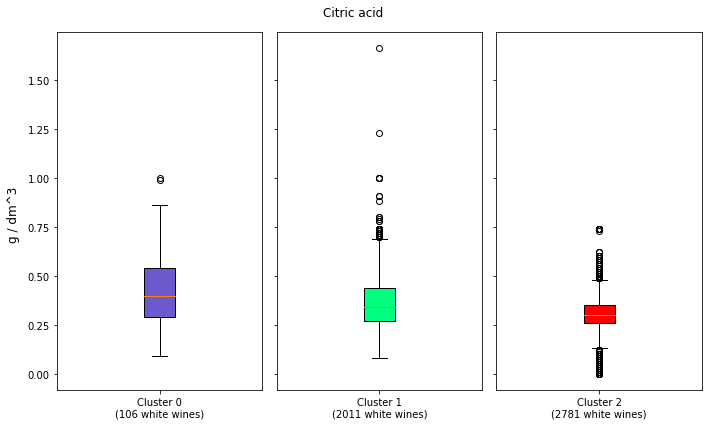

In [91]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,6), sharey=True)

ax1.boxplot(whitewine_cluster_0.loc[:,'citric acid'], patch_artist=True, boxprops=dict(facecolor='slateblue'))
ax2.boxplot(whitewine_cluster_1.loc[:,'citric acid'], patch_artist=True, boxprops=dict(facecolor='springgreen'))
ax3.boxplot(whitewine_cluster_2.loc[:,'citric acid'], patch_artist=True, boxprops=dict(facecolor='red'))

ax1.set_xticklabels([f'Cluster 0\n({len(whitewine_cluster_0)} white wines)'])
ax2.set_xticklabels([f'Cluster 1\n({len(whitewine_cluster_1)} white wines)'])
ax3.set_xticklabels([f'Cluster 2\n({len(whitewine_cluster_2)} white wines)'])

fig.suptitle('Citric acid')
fig.supylabel('g / dm^3')

fig.tight_layout()

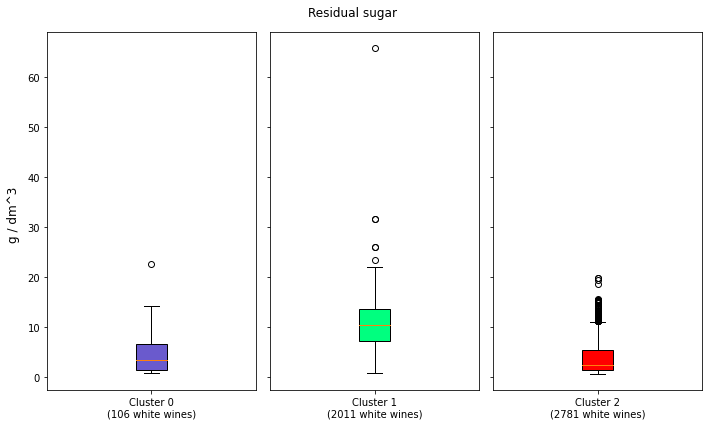

In [92]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,6), sharey=True)

ax1.boxplot(whitewine_cluster_0.loc[:,'residual sugar'], patch_artist=True, boxprops=dict(facecolor='slateblue'))
ax2.boxplot(whitewine_cluster_1.loc[:,'residual sugar'], patch_artist=True, boxprops=dict(facecolor='springgreen'))
ax3.boxplot(whitewine_cluster_2.loc[:,'residual sugar'], patch_artist=True, boxprops=dict(facecolor='red'))

ax1.set_xticklabels([f'Cluster 0\n({len(whitewine_cluster_0)} white wines)'])
ax2.set_xticklabels([f'Cluster 1\n({len(whitewine_cluster_1)} white wines)'])
ax3.set_xticklabels([f'Cluster 2\n({len(whitewine_cluster_2)} white wines)'])

fig.suptitle('Residual sugar')
fig.supylabel('g / dm^3')

fig.tight_layout()

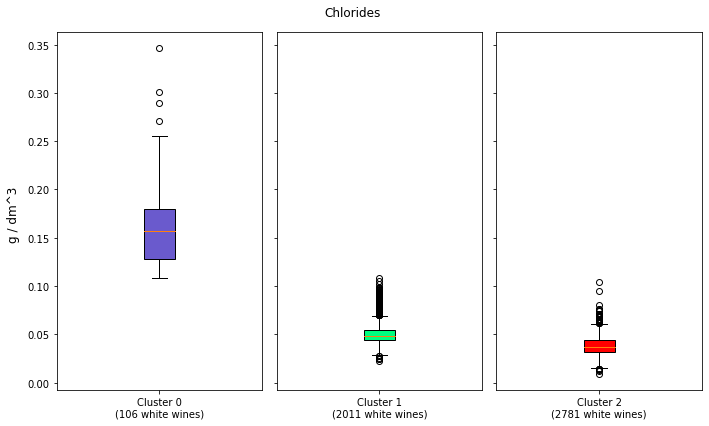

In [93]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,6), sharey=True)

ax1.boxplot(whitewine_cluster_0.loc[:,'chlorides'], patch_artist=True, boxprops=dict(facecolor='slateblue'))
ax2.boxplot(whitewine_cluster_1.loc[:,'chlorides'], patch_artist=True, boxprops=dict(facecolor='springgreen'))
ax3.boxplot(whitewine_cluster_2.loc[:,'chlorides'], patch_artist=True, boxprops=dict(facecolor='red'))

ax1.set_xticklabels([f'Cluster 0\n({len(whitewine_cluster_0)} white wines)'])
ax2.set_xticklabels([f'Cluster 1\n({len(whitewine_cluster_1)} white wines)'])
ax3.set_xticklabels([f'Cluster 2\n({len(whitewine_cluster_2)} white wines)'])

fig.suptitle('Chlorides')
fig.supylabel('g / dm^3')

fig.tight_layout()

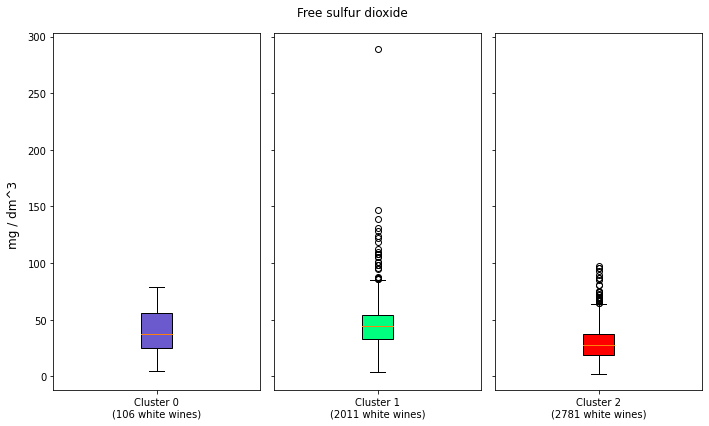

In [94]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,6), sharey=True)

ax1.boxplot(whitewine_cluster_0.loc[:,'free sulfur dioxide'], patch_artist=True, boxprops=dict(facecolor='slateblue'))
ax2.boxplot(whitewine_cluster_1.loc[:,'free sulfur dioxide'], patch_artist=True, boxprops=dict(facecolor='springgreen'))
ax3.boxplot(whitewine_cluster_2.loc[:,'free sulfur dioxide'], patch_artist=True, boxprops=dict(facecolor='red'))

ax1.set_xticklabels([f'Cluster 0\n({len(whitewine_cluster_0)} white wines)'])
ax2.set_xticklabels([f'Cluster 1\n({len(whitewine_cluster_1)} white wines)'])
ax3.set_xticklabels([f'Cluster 2\n({len(whitewine_cluster_2)} white wines)'])

fig.suptitle('Free sulfur dioxide')
fig.supylabel('mg / dm^3')

fig.tight_layout()

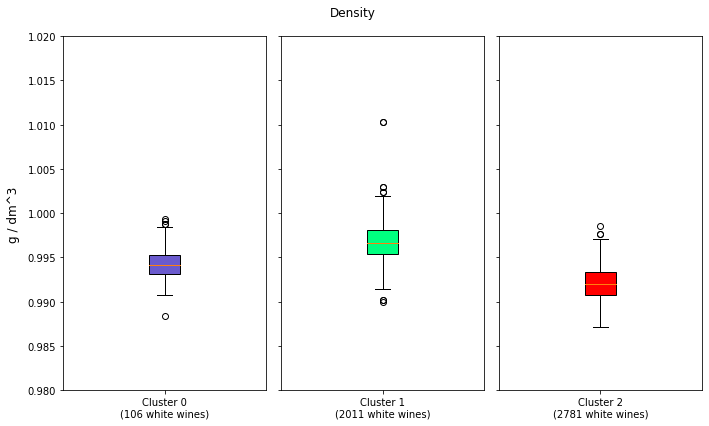

In [95]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,6), sharey=True)

ax1.boxplot(whitewine_cluster_0.loc[:,'density'], patch_artist=True, boxprops=dict(facecolor='slateblue'))
ax2.boxplot(whitewine_cluster_1.loc[:,'density'], patch_artist=True, boxprops=dict(facecolor='springgreen'))
ax3.boxplot(whitewine_cluster_2.loc[:,'density'], patch_artist=True, boxprops=dict(facecolor='red'))

ax1.set_xticklabels([f'Cluster 0\n({len(whitewine_cluster_0)} white wines)'])
ax2.set_xticklabels([f'Cluster 1\n({len(whitewine_cluster_1)} white wines)'])
ax3.set_xticklabels([f'Cluster 2\n({len(whitewine_cluster_2)} white wines)'])

ax1.set_ylim(0.98,1.02)
ax2.set_ylim(0.98,1.02)
ax3.set_ylim(0.98,1.02)

fig.suptitle('Density')
fig.supylabel('g / dm^3')

fig.tight_layout()

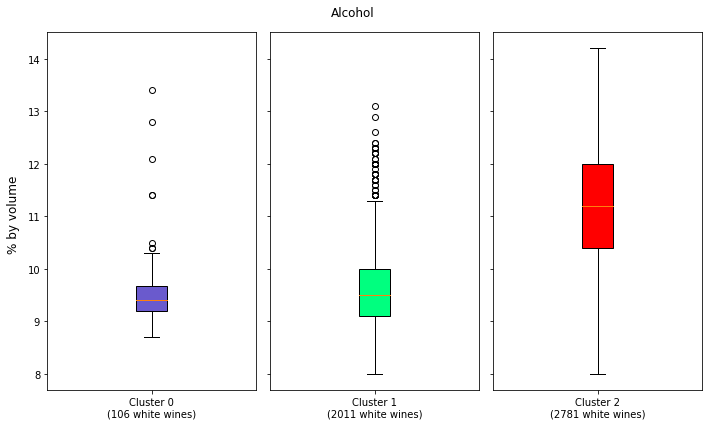

In [96]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,6), sharey=True)

ax1.boxplot(whitewine_cluster_0.loc[:,'alcohol'], patch_artist=True, boxprops=dict(facecolor='slateblue'))
ax2.boxplot(whitewine_cluster_1.loc[:,'alcohol'], patch_artist=True, boxprops=dict(facecolor='springgreen'))
ax3.boxplot(whitewine_cluster_2.loc[:,'alcohol'], patch_artist=True, boxprops=dict(facecolor='red'))

ax1.set_xticklabels([f'Cluster 0\n({len(whitewine_cluster_0)} white wines)'])
ax2.set_xticklabels([f'Cluster 1\n({len(whitewine_cluster_1)} white wines)'])
ax3.set_xticklabels([f'Cluster 2\n({len(whitewine_cluster_2)} white wines)'])

fig.suptitle('Alcohol')
fig.supylabel('% by volume')

fig.tight_layout()

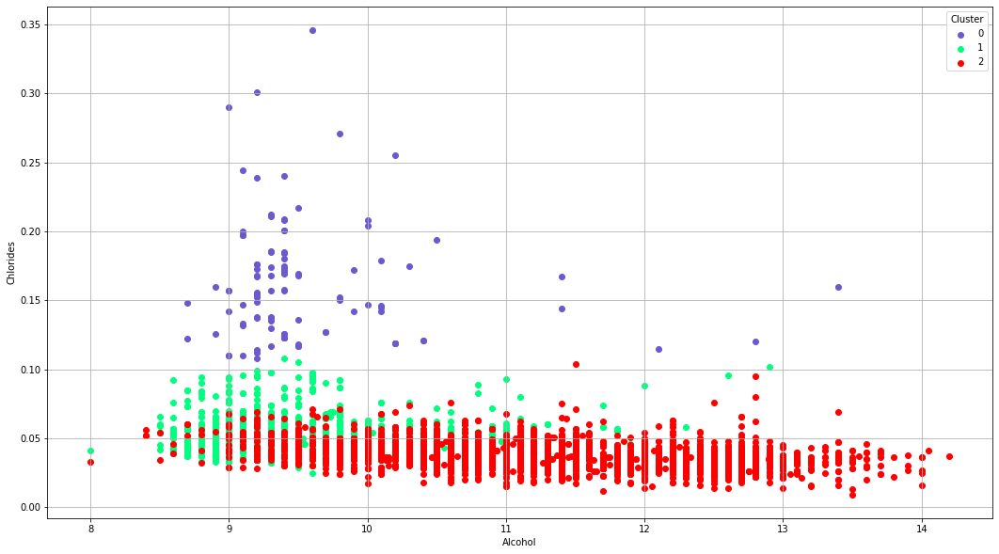

In [97]:
plt.figure(figsize=(18,10))
plt.scatter(whitewine_cluster_0.loc[:, 'alcohol'], whitewine_cluster_0.loc[:, 'chlorides'], color='slateblue')
plt.scatter(whitewine_cluster_1.loc[:, 'alcohol'], whitewine_cluster_1.loc[:, 'chlorides'], color='springgreen')
plt.scatter(whitewine_cluster_2.loc[:, 'alcohol'], whitewine_cluster_2.loc[:, 'chlorides'], color='red')


plt.legend([0,1,2], title='Cluster')
plt.xlabel('Alcohol')
plt.ylabel('Chlorides')
plt.grid()

- Observations in white wines:
    - Cluster 2 has relatively high chlorides
    - Cluster 0 has relatively high alcohol %
    - Cluster 1 does not have relatively high chlorides nor alcohol %
    - Cluster ratio distribution is about evenly distributed on two clusters


# Conclusion of Further EDA 
- Red wines
    - Cluster 0 – normal red wines
    - Cluster 1 – relatively high chlorides – dry red wines
    - Cluster 2 – relatively high residual sugar – sweet red wines
- White wines
    - Cluster 0 – relatively high alcohol % – high alcohol white wines
    - Cluster 1 – normal white wines
    - Cluster 2 – relatively high chlorides % – dry white wines